In [1]:
# Pacotes iniciais
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.figsize']=(10,10)

In [2]:
import os
os.chdir('..')
os.getcwd()

'/media/fellipegm/Data/Drive/07 Projetos/Projeto-CESAR'

### Data import

In [3]:
df = pd.read_csv('./data/Bias_correction_ucl.csv')

### Data description

The data is a timeseries (cross sectional data) that has the air temperature for 25 geographically spaced stations in South Korea. They have a model (LDAPS) the predict many variables for the next day,however, the LDAPS model present a temperature prediction bias for many stations (as stated by the paper authors, [Dataset](https://archive.ics.uci.edu/ml/datasets/Bias+correction+of+numerical+prediction+model+temperature+forecast), [Paper](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2019EA000740)). The objective is to obtain models that use the variables and predict the next day air temperature with higher precision.

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8

In [4]:
print(df.head())
print(df.shape)

   station        Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
0      1.0  2013-06-30          28.7          21.4    58.255688    91.116364   
1      2.0  2013-06-30          31.9          21.6    52.263397    90.604721   
2      3.0  2013-06-30          31.6          23.3    48.690479    83.973587   
3      4.0  2013-06-30          32.0          23.4    58.239788    96.483688   
4      5.0  2013-06-30          31.4          21.9    56.174095    90.155128   

   LDAPS_Tmax_lapse  LDAPS_Tmin_lapse  LDAPS_WS    LDAPS_LH  ...  LDAPS_PPT2  \
0         28.074101         23.006936  6.818887   69.451805  ...         0.0   
1         29.850689         24.035009  5.691890   51.937448  ...         0.0   
2         30.091292         24.565633  6.138224   20.573050  ...         0.0   
3         29.704629         23.326177  5.650050   65.727144  ...         0.0   
4         29.113934         23.486480  5.735004  107.965535  ...         0.0   

   LDAPS_PPT3  LDAPS_PPT4      lat    

Let's evaluate the data completeness.

In [5]:
cons = pd.DataFrame({'columns' : df.columns,
                    'type': df.dtypes,
                    'missing' : df.isna().sum(),
                    'size' : df.shape[0],
                    'unique': df.nunique(),
                    'max': df.max(),
                    'min': df.min()})
cons['null-nbr'] = round(cons['missing'] / cons['size'],2)
cons

/tmp/ipykernel_27933/4188801853.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  'max': df.max(),
/tmp/ipykernel_27933/4188801853.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  'min': df.min()})


,columns,type,missing,size,unique,max,min,null-nbr
DEM,station,float64,0,7752,25,212.335000,12.370000,0.00
Date,Date,object,2,7752,310,NaN,NaN,0.00
LDAPS_CC1,Present_Tmax,float64,75,7752,7569,0.967277,0.000000,0.01
LDAPS_CC2,Present_Tmin,float64,75,7752,7582,0.968353,0.000000,0.01
LDAPS_CC3,LDAPS_RHmin,float64,75,7752,7599,0.983789,0.000000,0.01
LDAPS_CC4,LDAPS_RHmax,float64,75,7752,7524,0.974710,0.000000,0.01
LDAPS_LH,LDAPS_Tmax_lapse,float64,75,7752,7675,213.414006,-13.603212,0.01
LDAPS_PPT1,LDAPS_Tmin_lapse,float64,75,7752,2812,23.701544,0.000000,0.01
LDAPS_PPT2,LDAPS_WS,float64,75,7752,2510,21.621661,0.000000,0.01
LDAPS_PPT3,LDAPS_LH,float64,75,7752,2356,15.841235,0.000000,0.01


The data is rather well behaved, with not many orders of magnitude of variation between them. It might not be necessary to transform the input data.

The questions that come up to mind right now are:
1. Is there a correlation of one station to another? In principle it should, but it might change with time (wind direction change, perhaps);
2. Is there a correlation of the actual data with its past data? In principle it should, however, it might be possible to predict the variables with LDAPS variables only, without using a timeseries.

The measurements are all float numbers, no need to encode variables.

27 different slopes? In principle it looks strange. Error or earth inclination modification? The data is from July to August, which corresponds to summer season in South Korea.

If there is no Tmax, Tmin or station or date, then it seems that the data should be discarded.
In principle all lines with NaN will be discarded, as it seems that the data is important. It can be checked in the future if a simple AR-like model with only Present_Tmax and Present_Tmin is enough to predict Next_Tmax and Next_Tmin, then it would not be necessary to use all data, but this seems unlikely now.

In [6]:
df = df[df['Present_Tmax'].notna() & df['Present_Tmin'].notna() & 
        df['Next_Tmax'].notna() & df['Next_Tmin'].notna() & 
        df['station'].notna() & df['Date'].notna() & 
        df['LDAPS_RHmin'].notna()]

np.max(df.isna().sum())
# df.nunique()

0

## Initial data exploration

Plot the variables to have an idea about what we are dealing about.

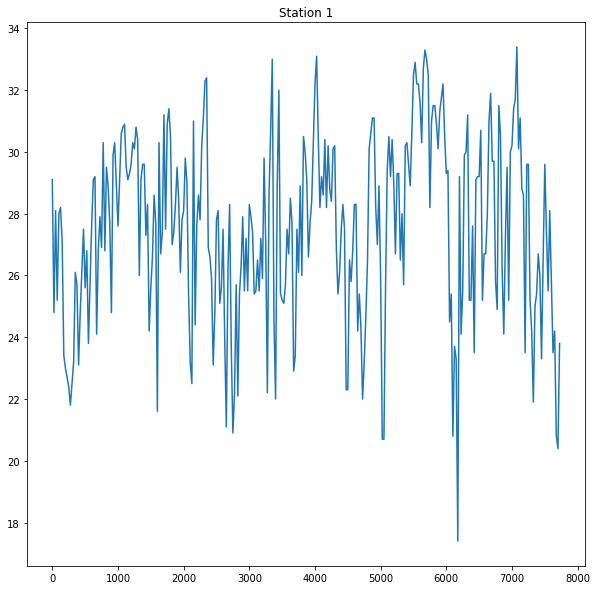

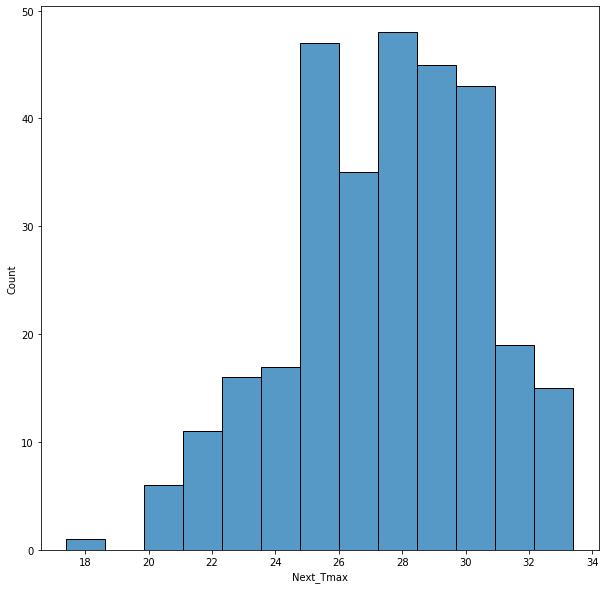

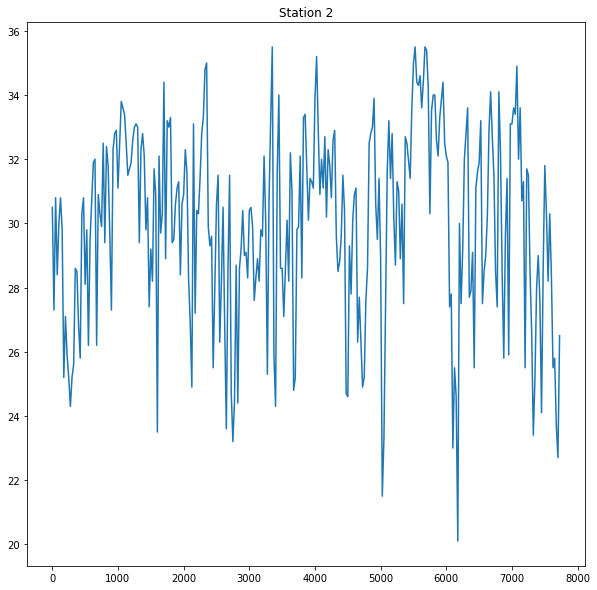

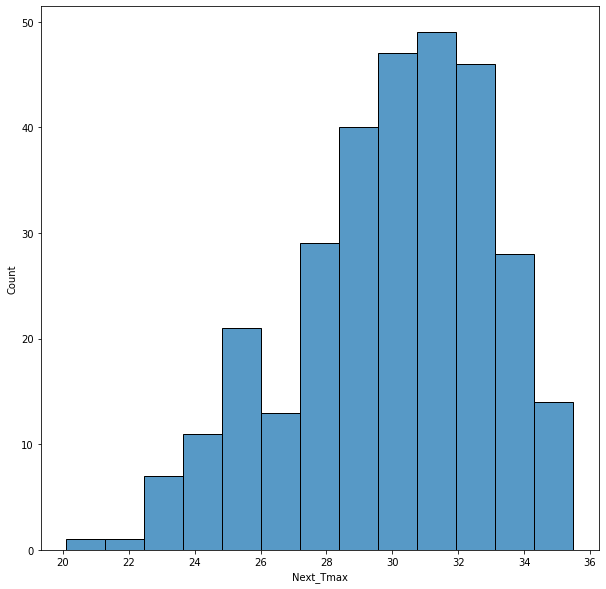

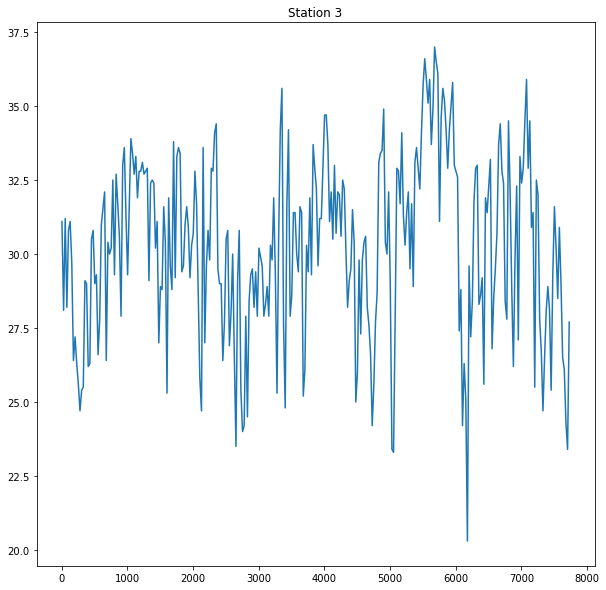

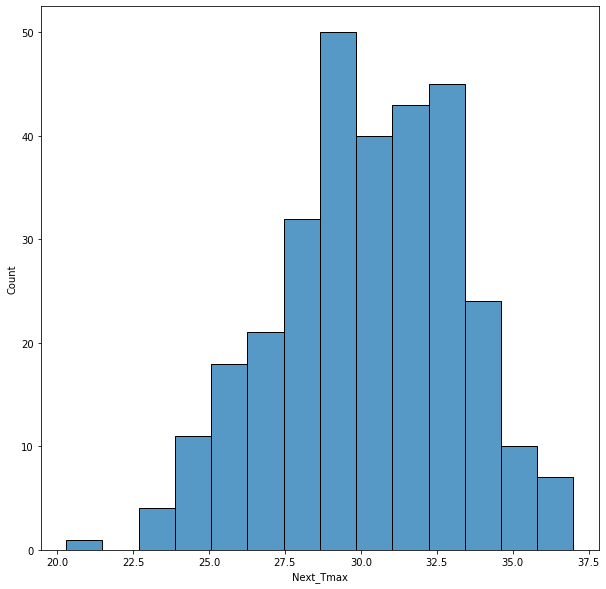

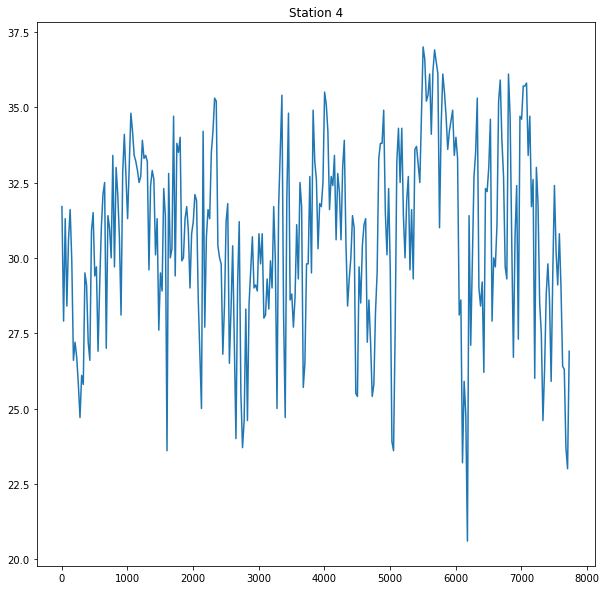

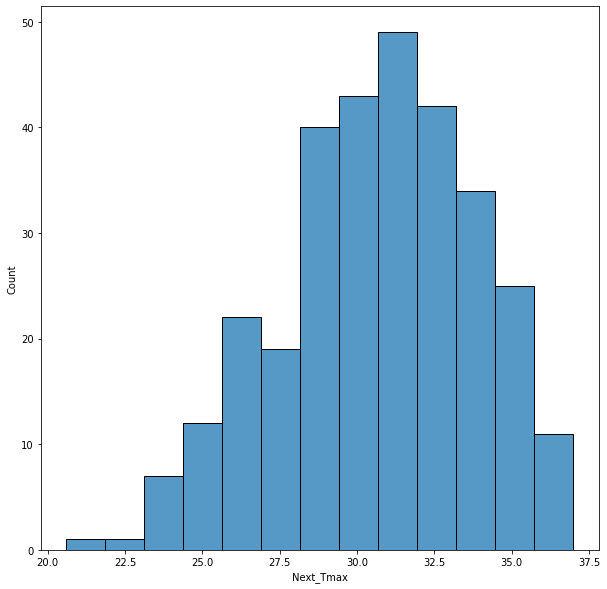

In [7]:
variable = 'Next_Tmax'

for i in range(1, 5):
    plt.figure()
    df[df['station']==i][variable].plot()
    plt.title(f'Station {i}')

    plt.figure()
    sns.histplot(df[df['station']==i][variable])

The slopes were fixed when the missed data were removed. No more slopes than the number of stations.

Solar radiation is a predicted variable that is the same for every station.

Some data present a gaussian-like distribution.

Let's have a look on the air temperature from different stations.

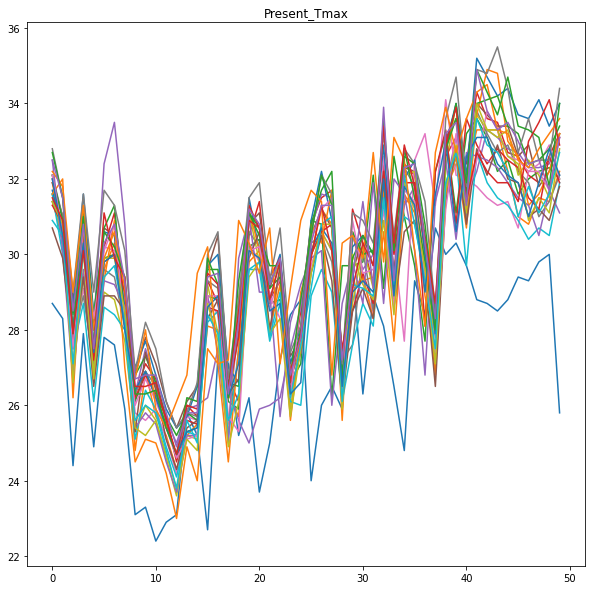

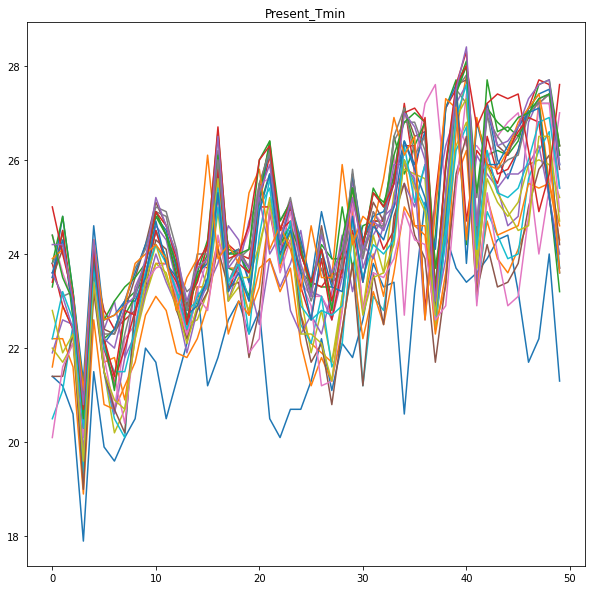

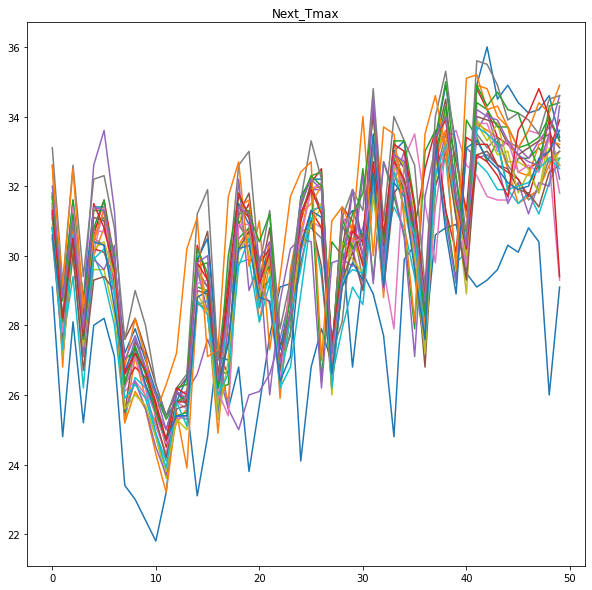

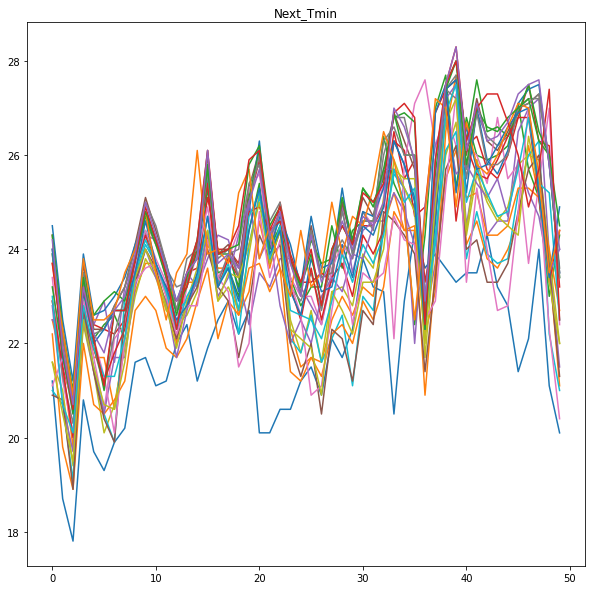

In [8]:
variables = ['Present_Tmax', 'Present_Tmin', 'Next_Tmax', 'Next_Tmin']

for variable in variables:
    plt.figure()
    plt.title(variable)
    for i in range(1, 26):
        plt.plot(np.array(df[df['station']==i][variable][0:50]))

Some stations present very close air temperatures, whereas a few stations present a very different behavior. This is another motivation to generate one model for each station.

Now let's evaluate how the LDAPS model predicts the next day air temperature.

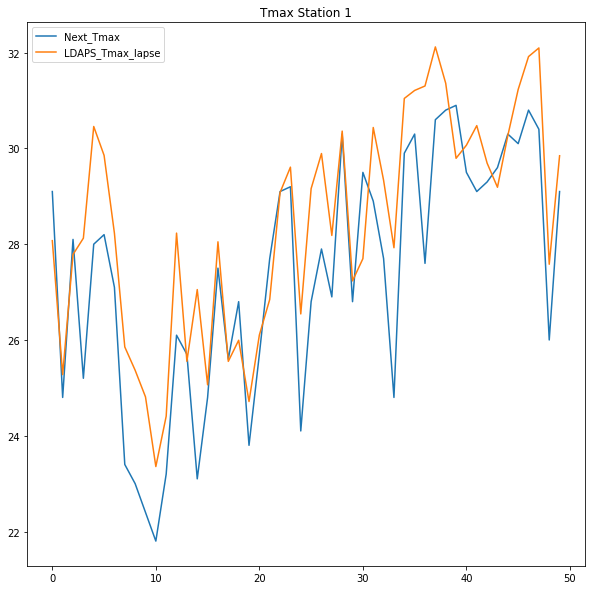

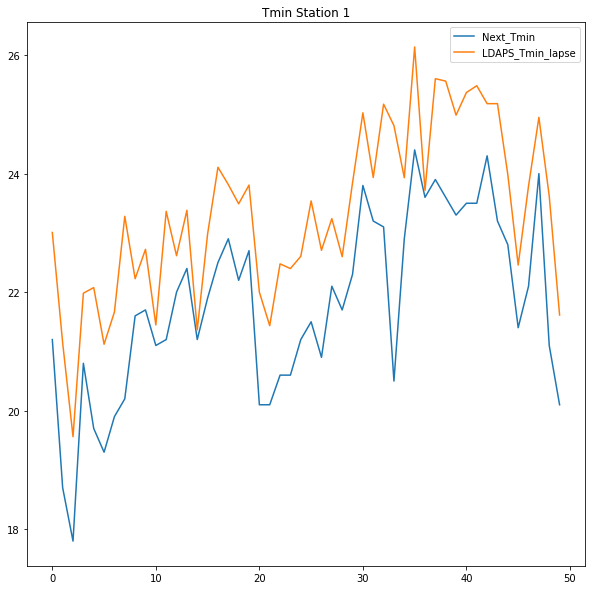

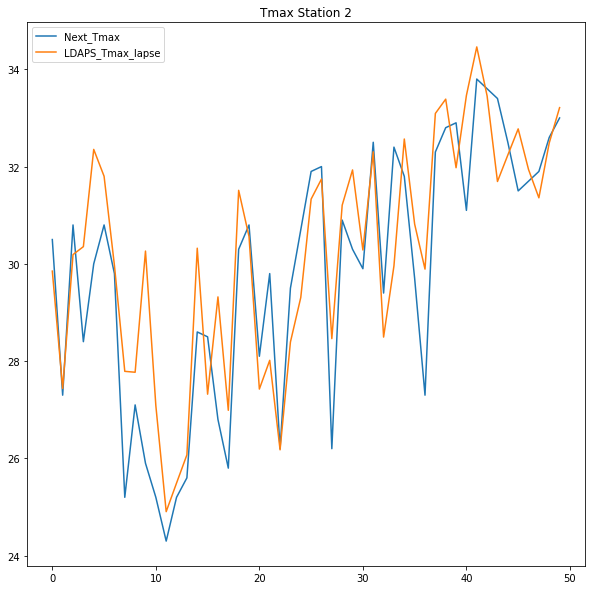

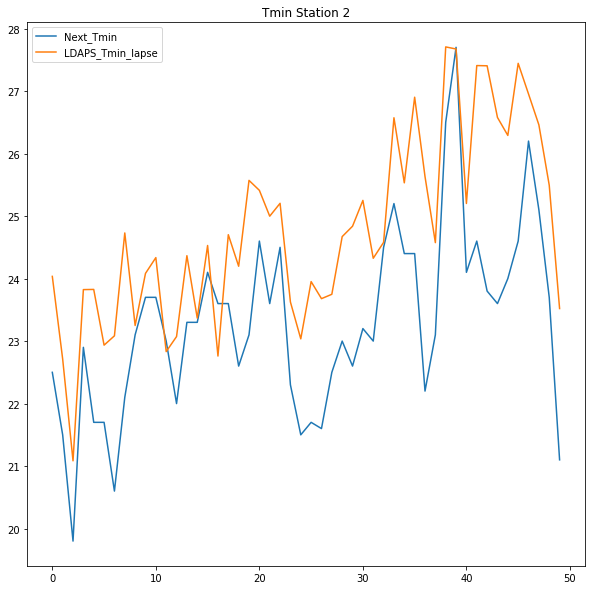

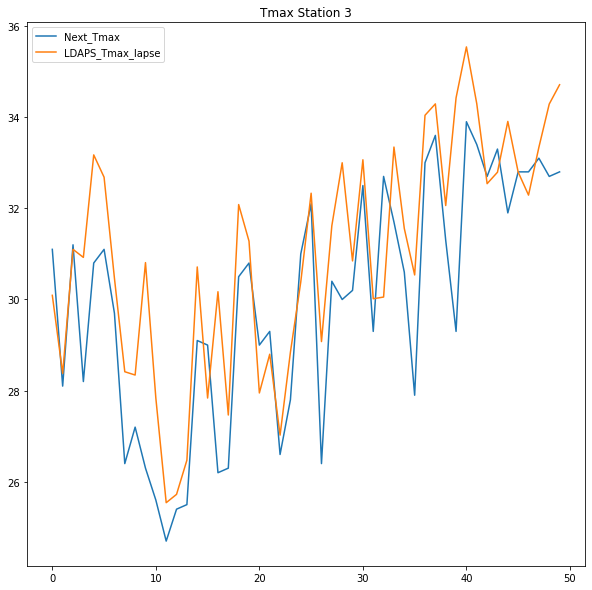

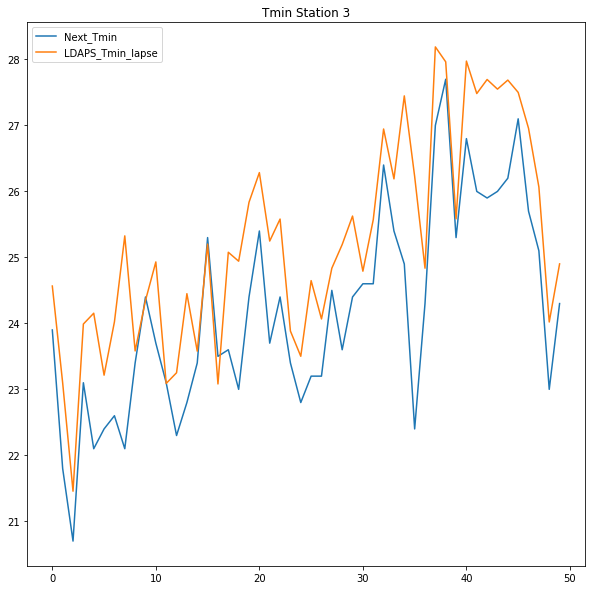

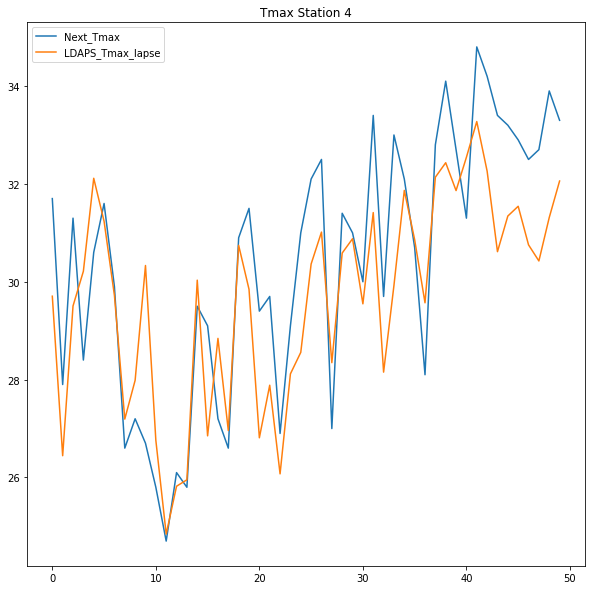

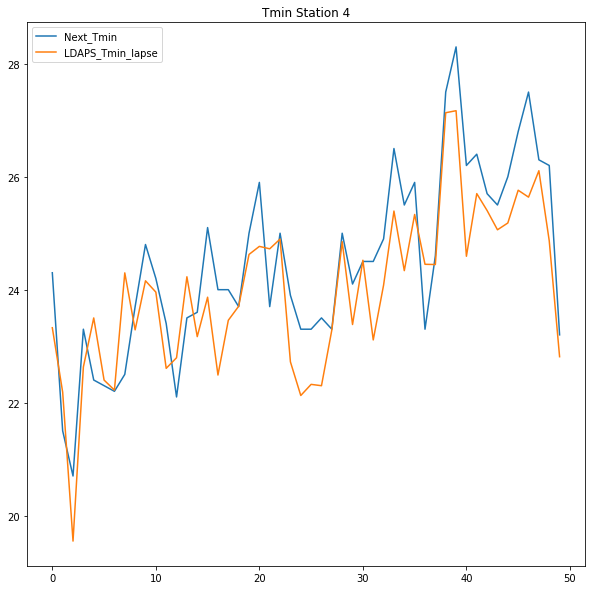

In [9]:
for i in range(1, 5):
    plt.figure()
    plt.plot(np.array(df[df['station']==i]['Next_Tmax'][0:50]))
    plt.plot(np.array(df[df['station']==i]['LDAPS_Tmax_lapse'][0:50]))
    plt.title(f'Tmax Station {i}')
    plt.legend(('Next_Tmax', 'LDAPS_Tmax_lapse'))

    plt.figure()
    plt.plot(np.array(df[df['station']==i]['Next_Tmin'][0:50]))
    plt.plot(np.array(df[df['station']==i]['LDAPS_Tmin_lapse'][0:50]))
    plt.title(f'Tmin Station {i}')
    plt.legend(('Next_Tmin', 'LDAPS_Tmin_lapse'))

It seems that the LDAPS model has a good prediction for some stations, however, it fails to deliver good predictions for other stations. The bias is visible in some of the timeseries comparison, as the authors have stated. It is a good idea to obtain numerical indexes to evaluate the LDAPS model residuals.

In [10]:
res_metrics = dict()
df_station = dict()

for variable in ['Tmax', 'Tmin']:
    print(f'Residual for {variable} prediction')
    print(f'Station\tMean\tStd')
    for i in range(1,26):
        df_station[i] = df[df['station'] == i].copy()
        df_station[i][f'residual {variable} LDAPS {i}'] = df_station[i][f'Next_{variable}'] - df_station[i][f'LDAPS_{variable}_lapse']
        res_metrics[f'station {i}'] = dict()
        res_metrics[f'station {i}']['mean'] = df_station[i][f'residual {variable} LDAPS {i}'].mean() 
        res_metrics[f'station {i}']['std'] = df_station[i][f'residual {variable} LDAPS {i}'].std()
        print('{}\t{:.2f}\t{:.2f}'.format(i, float(res_metrics[f'station {i}']['mean']), float(res_metrics[f'station {i}']['std'])))

Residual for Tmax prediction
Station	Mean	Std
1	-0.35	1.42
2	0.02	1.46
3	-0.55	1.59
4	1.75	1.60
5	0.72	1.63
6	0.47	1.45
7	1.56	1.50
8	0.57	1.48
9	1.64	1.65
10	0.98	1.46
11	0.12	1.58
12	0.21	1.83
13	0.15	1.61
14	0.07	1.55
15	0.09	1.70
16	0.18	1.49
17	0.44	1.52
18	2.12	1.76
19	0.43	1.60
20	1.96	1.50
21	-0.70	1.52
22	0.87	1.59
23	1.67	1.57
24	0.89	1.49
25	0.20	1.56
Residual for Tmin prediction
Station	Mean	Std
1	-1.25	0.81
2	-1.65	0.94
3	-0.89	0.88
4	0.73	0.97
5	-0.49	0.90
6	-0.16	0.93
7	0.03	1.02
8	-0.23	0.96
9	-0.31	0.97
10	-0.93	1.17
11	-0.64	0.93
12	-1.54	0.90
13	-0.07	0.87
14	-0.98	0.99
15	-1.20	0.91
16	-1.52	0.97
17	-1.44	1.06
18	0.26	1.01
19	-1.34	0.95
20	0.43	0.91
21	-0.57	0.98
22	-0.35	1.03
23	-0.16	1.00
24	-0.19	1.01
25	-0.57	0.97


In fact, the residual statistical parameters show that some stations present a mean value far from zero. This means that the LDAPS model, in average, presents a prediction error when compared to the measured next day air temperature. It is desired to have a model with the residual mean as close to zero as possible.

At this point, the correlations are evaluated.

### What is the correlation between the variables in the same day and in the same station?

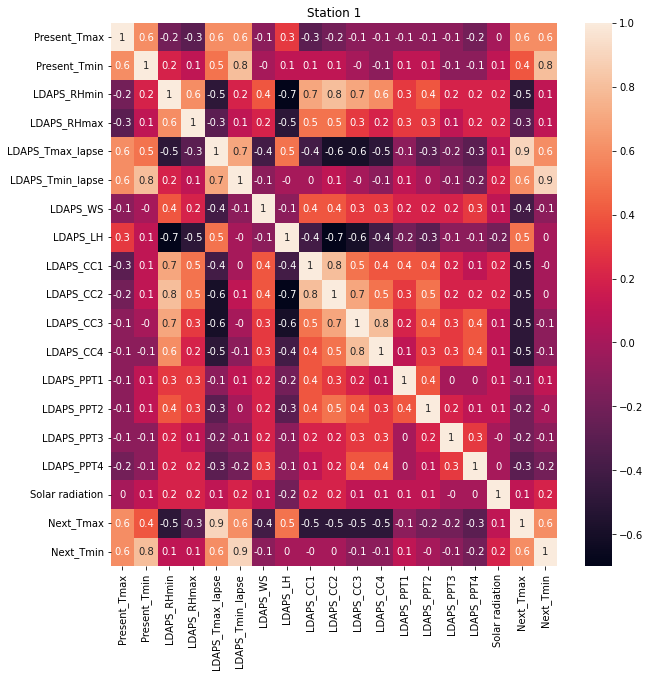

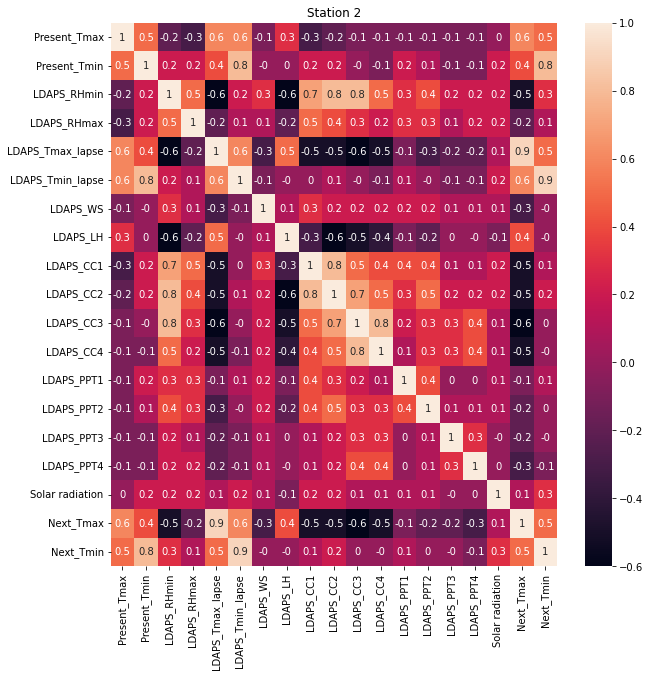

In [11]:
useful_columns = [
                  'Present_Tmax',
                  'Present_Tmin',
                  'LDAPS_RHmin',
                  'LDAPS_RHmax',
                  'LDAPS_Tmax_lapse',
                  'LDAPS_Tmin_lapse',
                  'LDAPS_WS',
                  'LDAPS_LH',
                  'LDAPS_CC1',
                  'LDAPS_CC2',
                  'LDAPS_CC3',
                  'LDAPS_CC4',
                  'LDAPS_PPT1',
                  'LDAPS_PPT2',
                  'LDAPS_PPT3',
                  'LDAPS_PPT4',
                  'Solar radiation',
                  'Next_Tmax',
                  'Next_Tmin',
                  ]

for i in range(1, 3):
    plt.figure()
    plt.title(f'Station {i}')
    sns.heatmap(df[df['station']==i][useful_columns].corr().round(1), annot= True)

Many variables have a high correlation with Next_Tmax and Next_Tmin. Some interfere more with Tmax than with Tmin. LDAPS_Tmax_lapse and LDAPS_Tmin_lapse have a high correlation with the desired predicted variables. This means that it is possible to predict, at least to some degree, the variables Next_Tmin and Next_Tmax using the LDAPS model variables.

The correlation signal is also coherent as, for example, when the cloud cover increases (LDAPS_CCi), the maximum air temperature decreases, as can be seen by the negative correlation coefficient for these variables with Next_Tmax.

The correlation coefficient depends on the station, however, in general, the variables have quite the same influence.

### How about the variables autocorrelation?

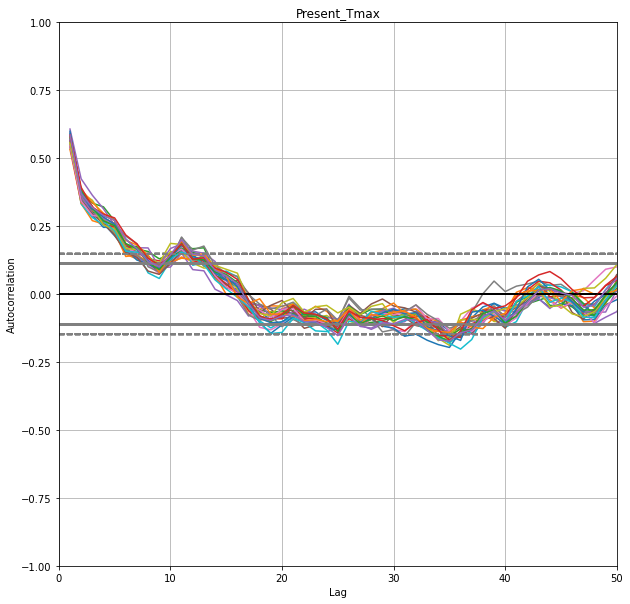

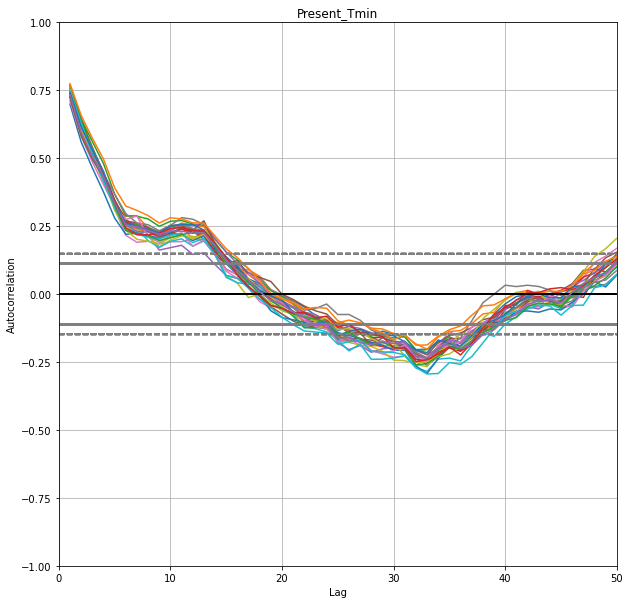

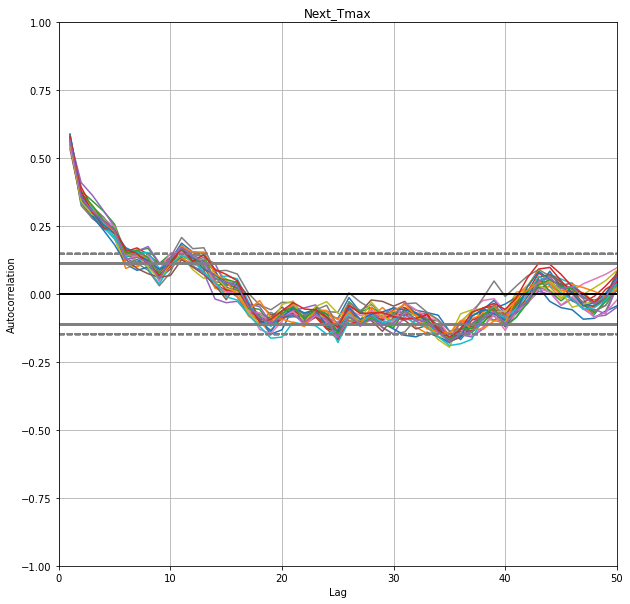

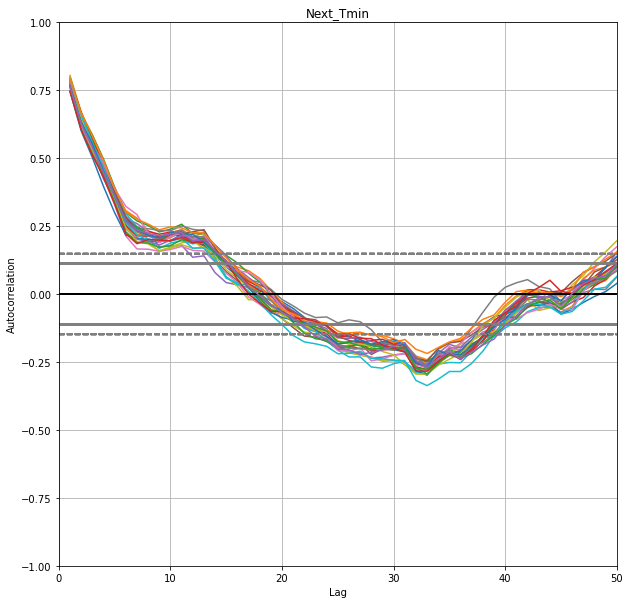

In [12]:
variables = ['Present_Tmax', 'Present_Tmin', 'Next_Tmax', 'Next_Tmin']

for variable in variables:
    plt.figure()
    plt.title(variable)
    for i in range(1, 26):
        pd.plotting.autocorrelation_plot(df[df['station']==i][variable])
        plt.xlim((0,50))

It is not surprising that the timeseries has a considerable autocorrelation. This means that the actual value can be, at least to some degree, explained by a linear combination of its past values. The autocorrelation plot, with decreasing values in the initial lags, indicates that the timeseries might present a trend. The oscillatory behavior of the autocorrelation plot of Next_Tmin and Present_Tmin indicates that the timeseries has some seasonality behavior. The problem using the timeseries is that the variables are discontinuous in time, with the summer part of the year, only.

In principle, it can be tested a timeseries approach to this problem, however, the best approach, with the available data until now, is to deliver a memoryless model.

### Is it possible to reduce the independent variables dimension?

As the majority of the variables are derived from the LDAPS model, there is a high possibility that it is possible to reduce the variables dimension, which is desirable to lower the model variance. Let's evaluate the Principal Component Analysis, which is one of the most simple methods for input dimension reducion.

In [13]:
from sklearn.decomposition import PCA

variables_pca = [
                  'Present_Tmax',
                  'Present_Tmin',
                  'LDAPS_RHmin',
                  'LDAPS_RHmax',
                  'LDAPS_Tmax_lapse',
                  'LDAPS_Tmin_lapse',
                  'LDAPS_WS',
                  'LDAPS_LH',
                  'LDAPS_CC1',
                  'LDAPS_CC2',
                  'LDAPS_CC3',
                  'LDAPS_CC4',
                  'LDAPS_PPT1',
                  'LDAPS_PPT2',
                  'LDAPS_PPT3',
                  'LDAPS_PPT4',
                  'Solar radiation',
                  ]


pca = PCA().fit(df_station[i][variables_pca])

evr = pca.explained_variance_ratio_

evr

array([9.97001260e-01, 1.91904786e-03, 7.06476885e-04, 1.94941138e-04,
       9.47088734e-05, 2.07663720e-05, 1.74159010e-05, 1.31607810e-05,
       1.14043478e-05, 7.64423639e-06, 5.76169482e-06, 4.27688856e-06,
       2.59804115e-06, 2.67710484e-07, 1.63649036e-07, 6.12866225e-08,
       4.40107008e-08])

In [14]:
pca = PCA(n_components=3)

for i in range(1, 26):
    projection = pca.fit_transform(df_station[i][variables_pca])
    for k in range(0, projection[0].size):
        df_station[i][f'pca {k}'] = projection[:,k]

With one transformed variable with PCA, it is possible to explain 99.7% of the input data variance, therefore, as already could be seen in the correlation matrix, the LDAPS variables are highly correlated. This also means that it might be difficult to improve considerably the air temperature prediction with this data.

### Is there any correlation between stations?

It is likely that, due to the geographical distribution of stations, that the measurement of one station in a given day might be useful to predict the air temperature in the future. This can be explained physically by the heat or cold waves that travel through space. This hypotesis can be evaluated by correlating the Next_Tmax(Tmin) of a given station with lagged Present_Tmax(Tmin) of other stations.

/tmp/ipykernel_27933/2466892703.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


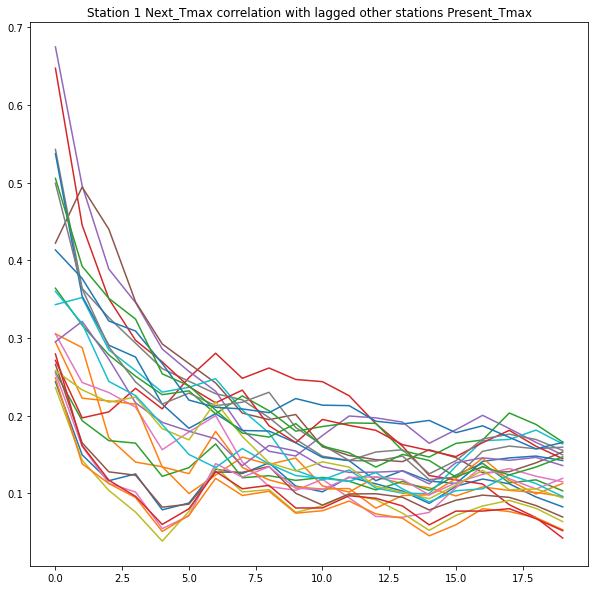

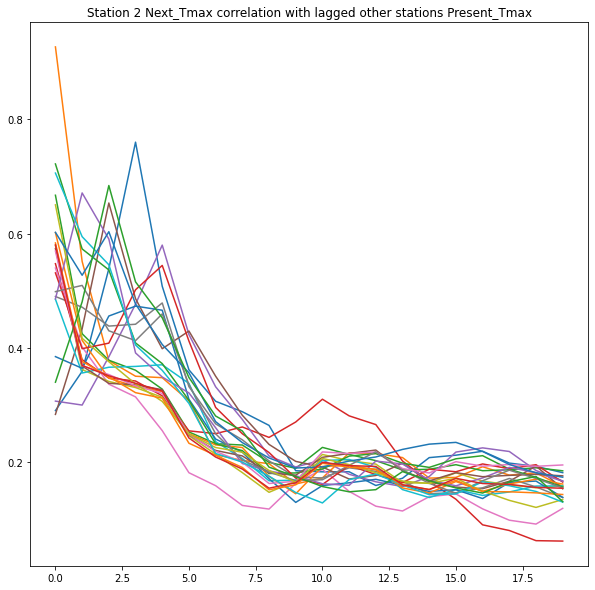

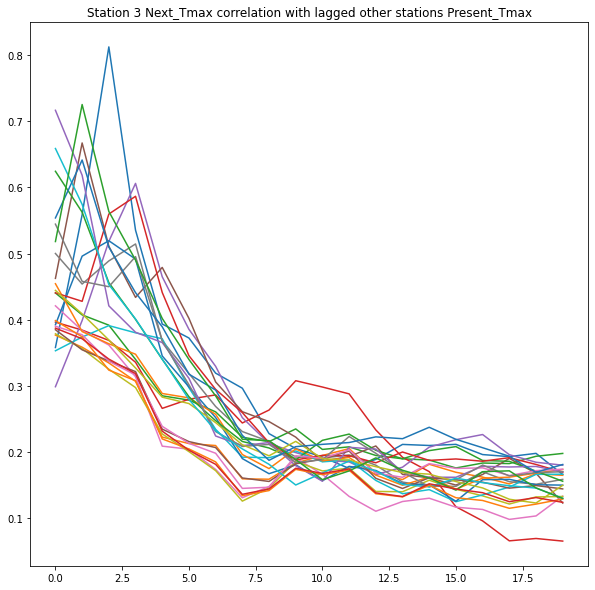

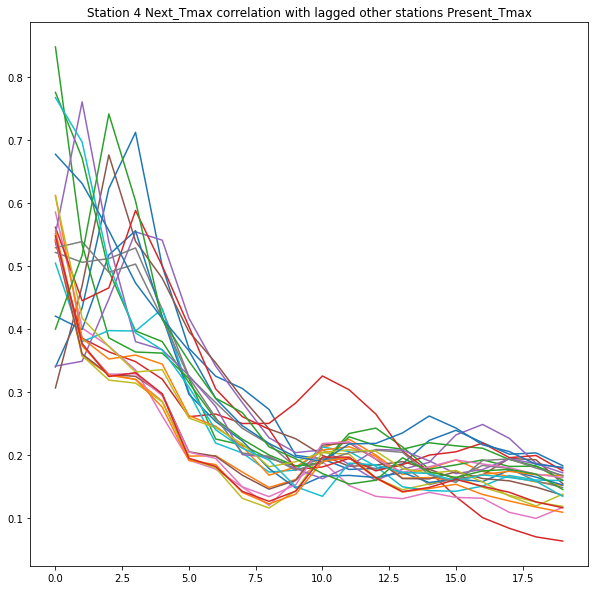

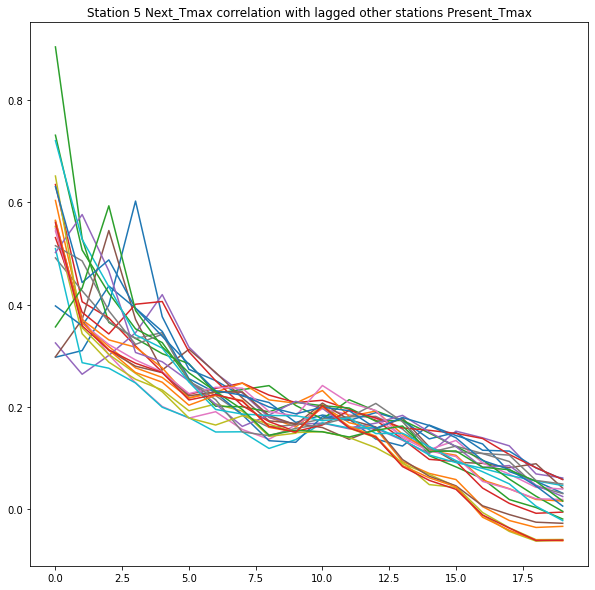

...

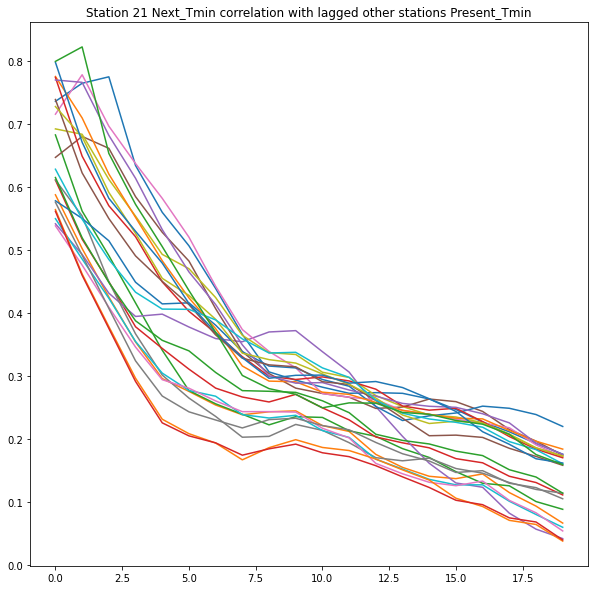

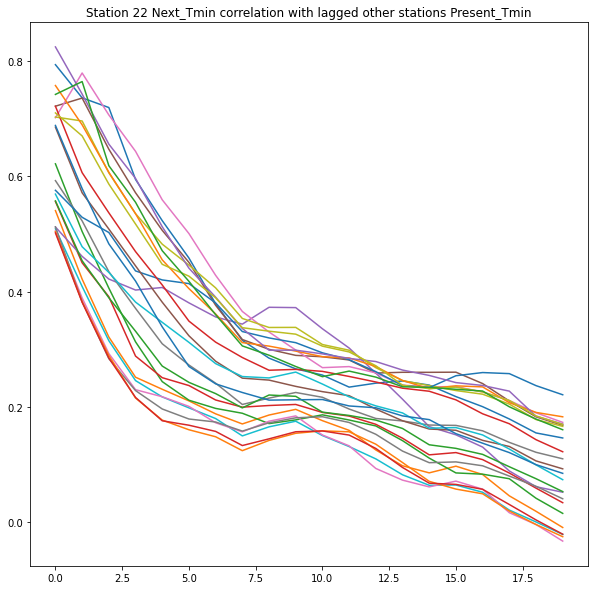

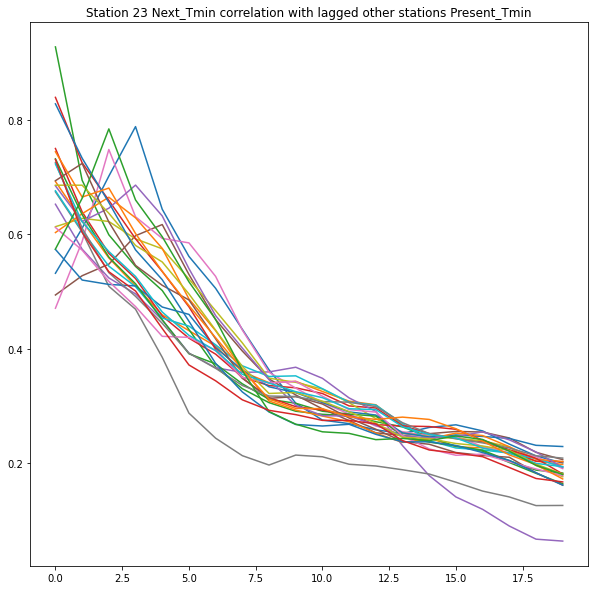

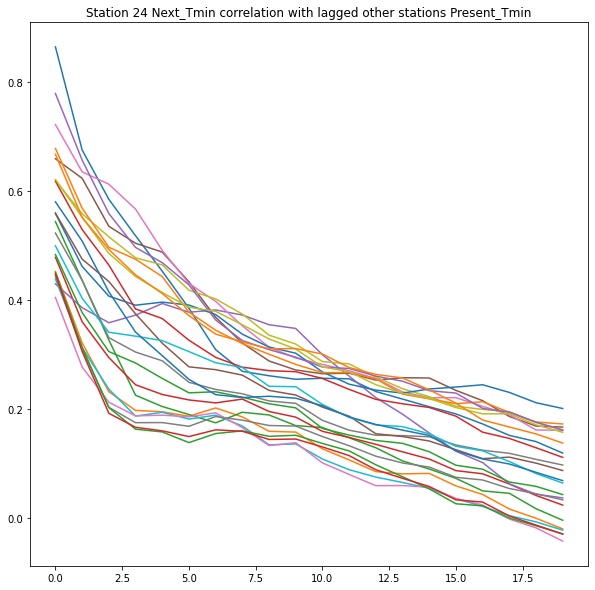

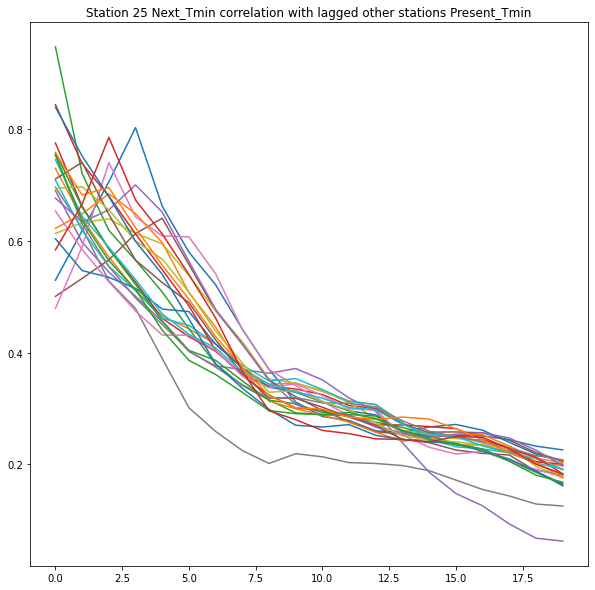

In [15]:
from functions.correlations import crosscorr

variables = ['Tmax', 'Tmin']

for variable in variables:
    for ct1 in range(1, 26):
        correlation = []
        for ct2 in range(1, 26):
            if ct1 == ct2:
                continue
            correlation.append([crosscorr(df_station[ct1][f'Next_{variable}'], df_station[ct2][f'Present_{variable}'], k) for k in range(0, 20)])

        plt.figure()
        plt.title(f'Station {ct1} Next_{variable} correlation with lagged other stations Present_{variable}')
        for k in range(0, len(correlation)):
            plt.plot(correlation[k])

The above graphics show that the Next_Tmax(Tmin) of one station can be partially inferred by the lagged values of Present_Tmax(Tmin) of other stations. The correlation data can be used to reduce the input data dimension, as only a subset of stations have a higher influence in a given station.